In [1]:
import zipfile
import os

# Define the path to your ZIP file and the directory to extract to
zip_file_path = '/Users/liliyachvileva/Desktop/neuefische/ds-eda-project-lily/data/data.zip'
extract_dir = '/Users/liliyachvileva/Desktop/neuefische/ds-eda-project-lily/data/extracted_data'

# Create the extraction directory if it doesn't exist
os.makedirs(extract_dir, exist_ok=True)
!
# Extract the contents of the ZIP file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

# List the extracted files
extracted_files = os.listdir(extract_dir)
print("Extracted files:", extracted_files)

Extracted files: ['King_County_House_prices_dataset.csv', '.ipynb_checkpoints']


In [2]:
# to show all names of columns:

In [3]:
import pandas as pd

# Load the CSV file into a DataFrame
file_path = '/Users/liliyachvileva/Desktop/neuefische/ds-eda-project-lily/data/extracted_data/King_County_House_prices_dataset.csv'
king_county_house_prices_dataset = pd.read_csv(file_path)

# Display the first few rows of the DataFrame
print(king_county_house_prices_dataset.head())



           id        date     price  bedrooms  bathrooms  sqft_living  \
0  7129300520  10/13/2014  221900.0         3       1.00         1180   
1  6414100192   12/9/2014  538000.0         3       2.25         2570   
2  5631500400   2/25/2015  180000.0         2       1.00          770   
3  2487200875   12/9/2014  604000.0         4       3.00         1960   
4  1954400510   2/18/2015  510000.0         3       2.00         1680   

   sqft_lot  floors  waterfront  view  ...  grade  sqft_above  sqft_basement  \
0      5650     1.0         NaN   0.0  ...      7        1180            0.0   
1      7242     2.0         0.0   0.0  ...      7        2170          400.0   
2     10000     1.0         0.0   0.0  ...      6         770            0.0   
3      5000     1.0         0.0   0.0  ...      7        1050          910.0   
4      8080     1.0         0.0   0.0  ...      8        1680            0.0   

  yr_built  yr_renovated  zipcode      lat     long  sqft_living15  sqft_lot15  

In [4]:
#to look at the data

king_county_house_prices_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [5]:
# Convert 'sqft_basement' column to numeric
king_county_house_prices_dataset['sqft_basement'] = pd.to_numeric(king_county_house_prices_dataset['sqft_basement'], errors='coerce')

# Convert 'date' column to datetime
king_county_house_prices_dataset['date'] = pd.to_datetime(king_county_house_prices_dataset['date'])


In [6]:
# Check for duplicates across all columns
duplicates = king_county_house_prices_dataset[king_county_house_prices_dataset.duplicated()]

# Print the duplicate rows
print("Duplicate Rows:")
print(duplicates)


Duplicate Rows:
Empty DataFrame
Columns: [id, date, price, bedrooms, bathrooms, sqft_living, sqft_lot, floors, waterfront, view, condition, grade, sqft_above, sqft_basement, yr_built, yr_renovated, zipcode, lat, long, sqft_living15, sqft_lot15]
Index: []

[0 rows x 21 columns]


In [7]:
# Find non-unique IDs
non_unique_ids = king_county_house_prices_dataset[king_county_house_prices_dataset.duplicated(subset=['id'], keep=False)]['id']

# Print non-unique IDs
print("Non-unique IDs:", non_unique_ids.unique())


Non-unique IDs: [6021501535 4139480200 7520000520 3969300030 2231500030 8820903380
  726049190 8682262400 9834200885 8062900070 1231000510 6117501820
 2228900270 3630120700 7888000390 2143700830 3395040550 4345000510
 9407110710    1000102 1781500435 1232000810 7856400240 7983000200
 9136103130 5083000375 7409700215 1823049202 2767602141 1254200015
  723049156 4435000705 4364700600 1825069031 3262300940 9353300600
 1524079093 9809000020 3303000130 7524400250 4204400098 6632900574
 2726049071 3578401060 1788800630 6381500170 1954420170 1545800290
 9828200460 9222400605 8832900780 8645530010 3323059027 5417600130
 8651510380 5249801440  526059224 1446403850  251300110 4139420590
 2621600015 2206700215 2787460720 3883800011 4154300296 1721801010
 1237500540 5101405604 5127001320 5282200015 7977201065 3739500096
 1568100300 1922059278  302000375  722039087 8129700644 4443800385
 2212200100 4302201085 5054800110 8103000110 2568300045 3598600049
 1219000473 3293700496 8945100320 2422049104 1

In [8]:
# Find non-unique IDs
non_unique_ids = king_county_house_prices_dataset[king_county_house_prices_dataset.duplicated(subset=['id'], keep=False)]['id']

# Calculate the number of non-unique IDs
num_non_unique_ids = len(non_unique_ids.unique())

# Print the number of non-unique IDs
print("Number of non-unique IDs:", num_non_unique_ids)

Number of non-unique IDs: 176


In [9]:
king_county_house_prices_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21597 non-null  int64         
 1   date           21597 non-null  datetime64[ns]
 2   price          21597 non-null  float64       
 3   bedrooms       21597 non-null  int64         
 4   bathrooms      21597 non-null  float64       
 5   sqft_living    21597 non-null  int64         
 6   sqft_lot       21597 non-null  int64         
 7   floors         21597 non-null  float64       
 8   waterfront     19221 non-null  float64       
 9   view           21534 non-null  float64       
 10  condition      21597 non-null  int64         
 11  grade          21597 non-null  int64         
 12  sqft_above     21597 non-null  int64         
 13  sqft_basement  21143 non-null  float64       
 14  yr_built       21597 non-null  int64         
 15  yr_renovated   1775

In [10]:
# Make a copy of the original dataset
king_county_house_prices_dataset_filled_missing_values = king_county_house_prices_dataset.copy()

# Apply modifications to handle missing values
# For example, you can impute missing values using mean, median, or mode
# Let's impute missing values in 'waterfront', 'view', and 'yr_renovated'
# 'waterfront' with the mode, 'view' with the mode, and 'yr_renovated' with 0
king_county_house_prices_dataset_filled_missing_values['waterfront'].fillna(king_county_house_prices_dataset_filled_missing_values['waterfront'].mode()[0], inplace=True)
king_county_house_prices_dataset_filled_missing_values['view'].fillna(king_county_house_prices_dataset_filled_missing_values['view'].mode()[0], inplace=True)
king_county_house_prices_dataset_filled_missing_values['yr_renovated'].fillna(0, inplace=True)

# Verify if missing values are handled
missing_values_filled = king_county_house_prices_dataset_filled_missing_values.isnull().sum()
print("Missing values in the filled dataset:\n", missing_values_filled)

# Now the unique_king_county_house_prices_dataset_filled_missing_values contains the original data with missing values handled



Missing values in the filled dataset:
 id                 0
date               0
price              0
bedrooms           0
bathrooms          0
sqft_living        0
sqft_lot           0
floors             0
waterfront         0
view               0
condition          0
grade              0
sqft_above         0
sqft_basement    454
yr_built           0
yr_renovated       0
zipcode            0
lat                0
long               0
sqft_living15      0
sqft_lot15         0
dtype: int64


In [11]:
# Make a copy of the original dataset
king_county_house_prices_dataset_filled_missing_values = king_county_house_prices_dataset.copy()

# Convert 'sqft_basement' to integers
king_county_house_prices_dataset_filled_missing_values['sqft_basement'] = king_county_house_prices_dataset_filled_missing_values['sqft_basement'].fillna(0).round().astype(int)

# Convert 'waterfront' to integers (0 or 1)
king_county_house_prices_dataset_filled_missing_values['waterfront'] = king_county_house_prices_dataset_filled_missing_values['waterfront'].fillna(0).astype(int)


#Replace missing values in 'view' with 0 
king_county_house_prices_dataset_filled_missing_values['view'].fillna(king_county_house_prices_dataset_filled_missing_values['view'].mode()[0], inplace=True)

# Replace missing values in 'yr_renovated' with 0
king_county_house_prices_dataset_filled_missing_values['yr_renovated'].fillna(0, inplace=True)

# Verify if missing values are handled and data types are corrected
corrected_missing_values = king_county_house_prices_dataset_filled_missing_values.isnull().sum()
print("Missing values in the dataset after correction:\n", corrected_missing_values)
print("\nData types after correction:\n", king_county_house_prices_dataset_filled_missing_values.dtypes)


Missing values in the dataset after correction:
 id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

Data types after correction:
 id                        int64
date             datetime64[ns]
price                   float64
bedrooms                  int64
bathrooms               float64
sqft_living               int64
sqft_lot                  int64
floors                  float64
waterfront                int64
view                    float64
condition                 int64
grade                     int64
sqft_above                int64
sqft_basement             int64
yr_built                  int64
yr_renovated            floa

In [12]:
# Import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [13]:
#Some statistics to find outliers

In [14]:
# Check summary statistics for numeric columns
statistics = king_county_house_prices_dataset_filled_missing_values.describe()

# Print the summary statistics
print(statistics)


                 id                           date         price  \
count  2.159700e+04                          21597  2.159700e+04   
mean   4.580474e+09  2014-10-29 04:20:38.171968512  5.402966e+05   
min    1.000102e+06            2014-05-02 00:00:00  7.800000e+04   
25%    2.123049e+09            2014-07-22 00:00:00  3.220000e+05   
50%    3.904930e+09            2014-10-16 00:00:00  4.500000e+05   
75%    7.308900e+09            2015-02-17 00:00:00  6.450000e+05   
max    9.900000e+09            2015-05-27 00:00:00  7.700000e+06   
std    2.876736e+09                            NaN  3.673681e+05   

           bedrooms     bathrooms   sqft_living      sqft_lot        floors  \
count  21597.000000  21597.000000  21597.000000  2.159700e+04  21597.000000   
mean       3.373200      2.115826   2080.321850  1.509941e+04      1.494096   
min        1.000000      0.500000    370.000000  5.200000e+02      1.000000   
25%        3.000000      1.750000   1430.000000  5.040000e+03      1.00

In [15]:
#lets find outliers based on visualisation

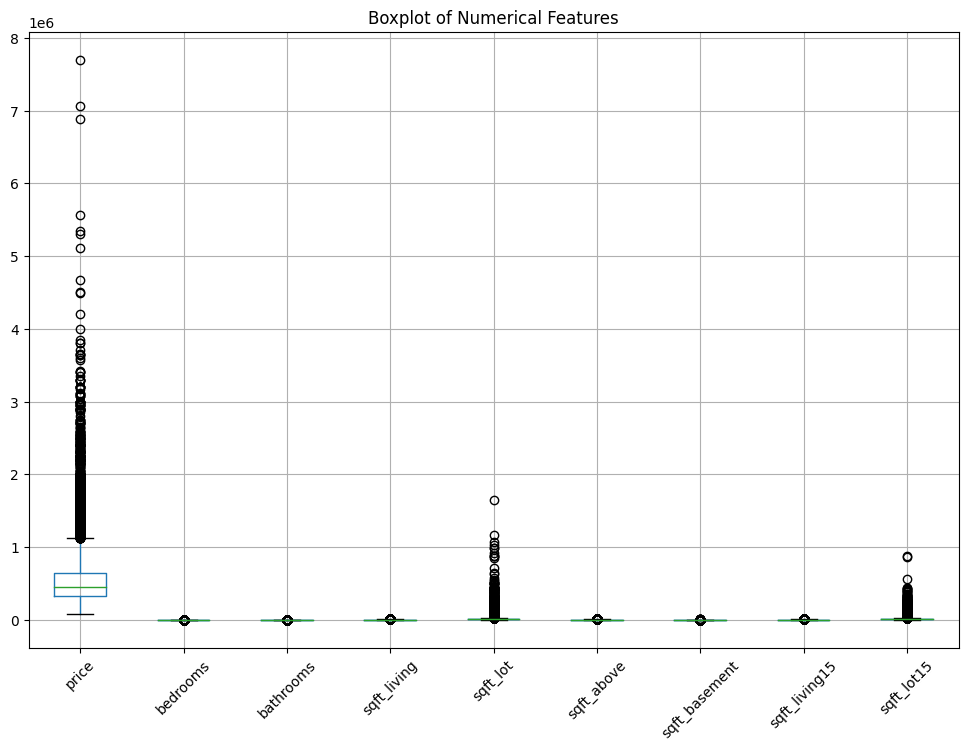

In [16]:
import matplotlib.pyplot as plt

# Select numerical features for boxplots
numerical_features = ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15']

# Create boxplots
plt.figure(figsize=(12, 8))
king_county_house_prices_dataset_filled_missing_values[numerical_features].boxplot()
plt.title('Boxplot of Numerical Features')
plt.xticks(rotation=45)
plt.show()


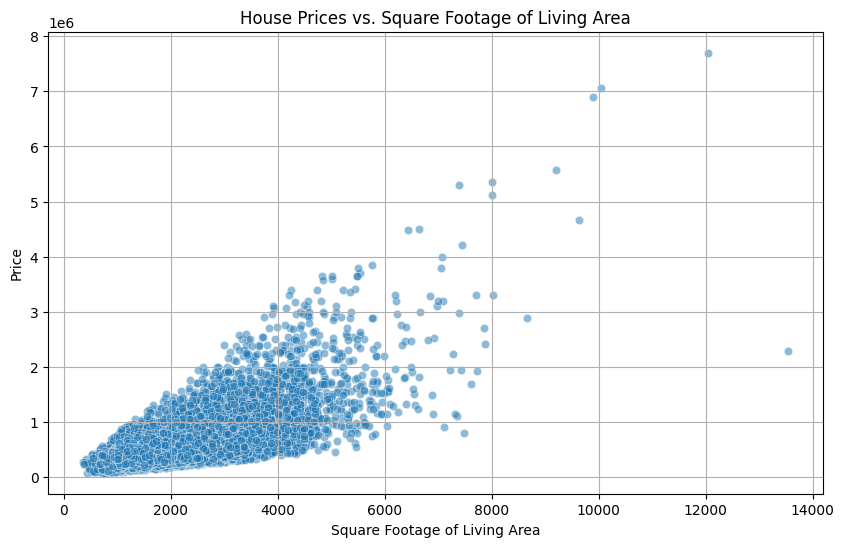

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Scatter plot for house prices and square footage of living area
plt.figure(figsize=(10, 6))
sns.scatterplot(x='sqft_living', y='price', data=king_county_house_prices_dataset_filled_missing_values, alpha=0.5)
plt.title('House Prices vs. Square Footage of Living Area')
plt.xlabel('Square Footage of Living Area')
plt.ylabel('Price')
plt.grid(True)
plt.show()


In [18]:
#SHOW max price and max sqft_living 

max_price = king_county_house_prices_dataset_filled_missing_values['price'].max()
print("Maximum Price:", max_price)

max_sqft_living = king_county_house_prices_dataset_filled_missing_values['sqft_living'].max()
print("Maximum Sqft Living:", max_sqft_living)



Maximum Price: 7700000.0
Maximum Sqft Living: 13540


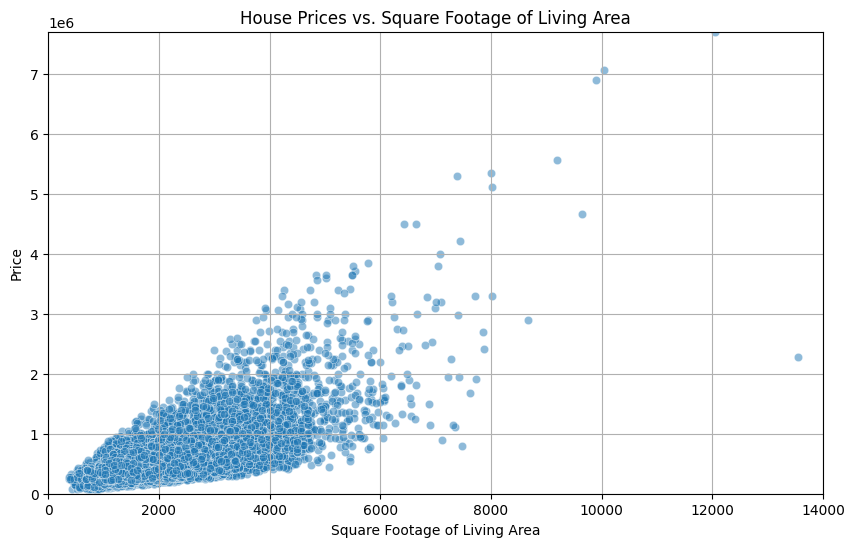

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

# Scatter plot for house prices and square footage of living area
plt.figure(figsize=(10, 6))
sns.scatterplot(x='sqft_living', y='price', data=king_county_house_prices_dataset_filled_missing_values, alpha=0.5)
plt.title('House Prices vs. Square Footage of Living Area')
plt.xlabel('Square Footage of Living Area')
plt.ylabel('Price')
plt.grid(True)

# Set the limits for the x and y axes
plt.xlim(0, 14000)
plt.ylim(0,  7700000)  # Adjust the upper limit based on the maximum price in your dataset

plt.show()


In [20]:
#HYPOTHESIS: THE HIGHER THE SQFT THE HIGHER THE PRICE

In [21]:
#hypothesis: where reinovation is needed the price is lower 

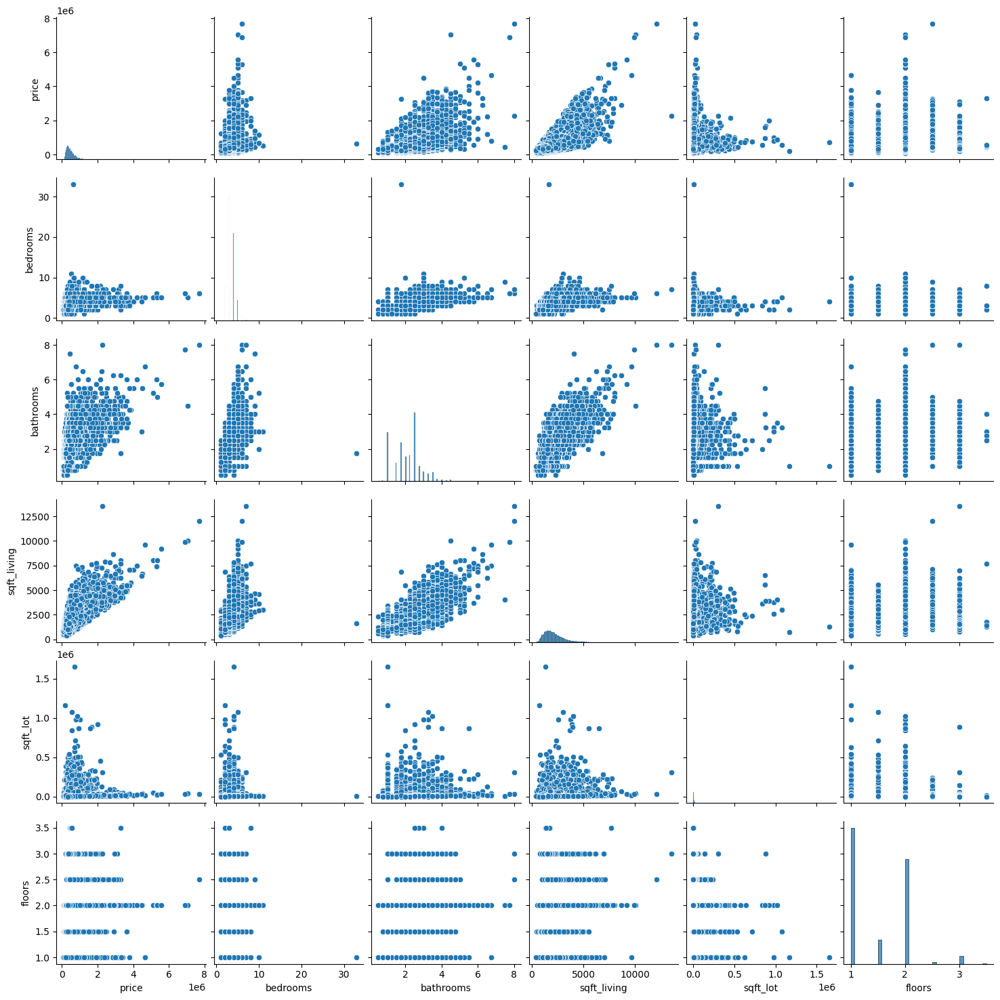

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select relevant columns for pair plot
columns = ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors']

# Create pair plot
sns.pairplot(king_county_house_prices_dataset_filled_missing_values[columns])
plt.show()


In [23]:
#lets look at yr_revovated and price 

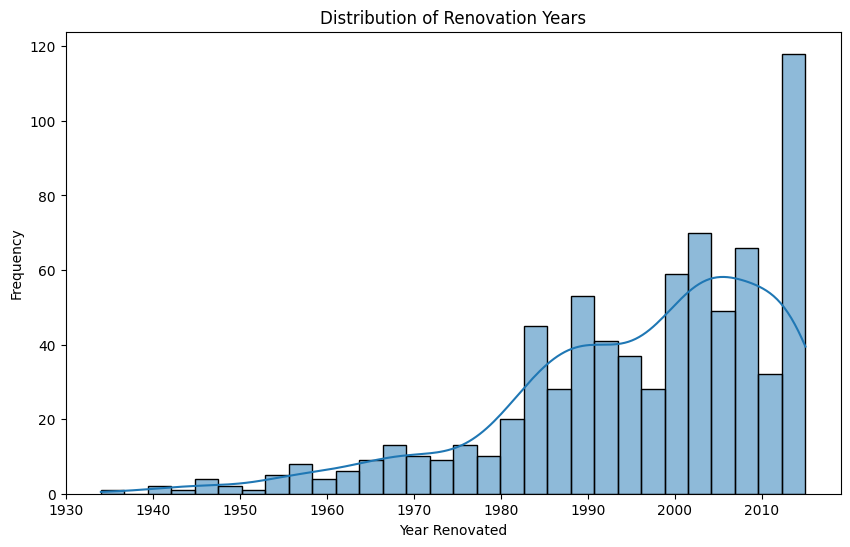

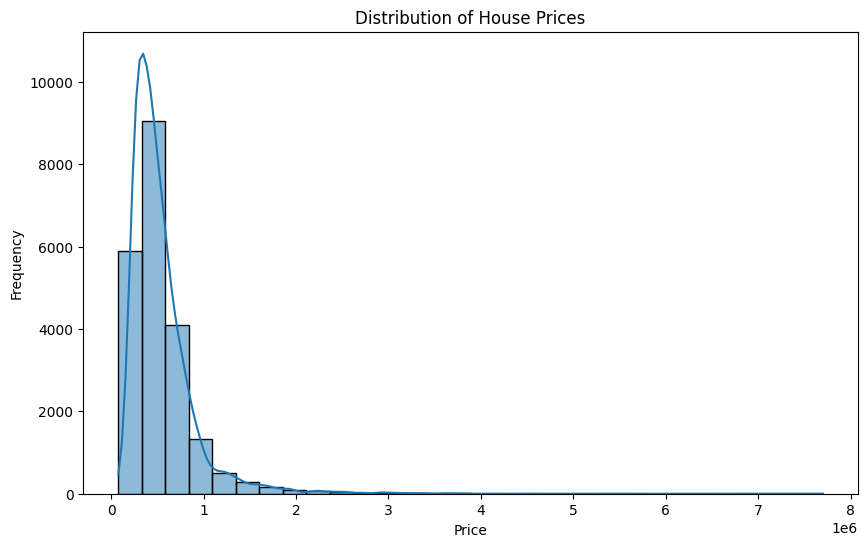

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter out houses with no renovation
renovated_houses = king_county_house_prices_dataset_filled_missing_values[king_county_house_prices_dataset_filled_missing_values['yr_renovated'] > 0]

# Create a histogram for 'yr_renovated'
plt.figure(figsize=(10, 6))
sns.histplot(data=renovated_houses, x='yr_renovated', bins=30, kde=True)
plt.title('Distribution of Renovation Years')
plt.xlabel('Year Renovated')
plt.ylabel('Frequency')
plt.show()

# Create a histogram for 'price'
plt.figure(figsize=(10, 6))
sns.histplot(data=king_county_house_prices_dataset_filled_missing_values, x='price', bins=30, kde=True)
plt.title('Distribution of House Prices')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()


In [25]:
#HYPOTHESIS: Houses that have been renovated more recently tend to have higher prices

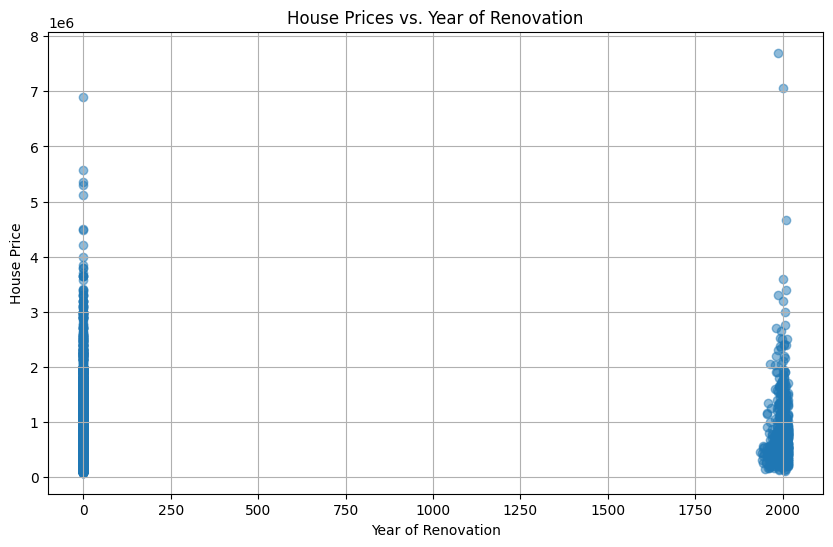

In [26]:
import matplotlib.pyplot as plt

# Extracting data for visualization
prices = king_county_house_prices_dataset_filled_missing_values['price']
yr_renovated = king_county_house_prices_dataset_filled_missing_values['yr_renovated']

# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(yr_renovated, prices, alpha=0.5)
plt.title('House Prices vs. Year of Renovation')
plt.xlabel('Year of Renovation')
plt.ylabel('House Price')
plt.grid(True)
plt.show()


In [27]:
#lets exclude yr_renovation=0

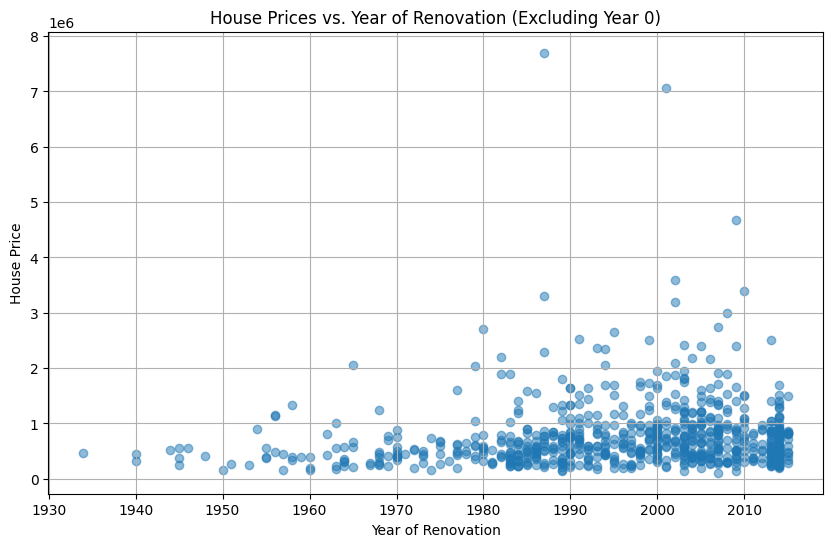

In [28]:
import matplotlib.pyplot as plt

# Filter data where yr_renovated is not 0
renovated_data = king_county_house_prices_dataset_filled_missing_values[king_county_house_prices_dataset_filled_missing_values['yr_renovated'] != 0]

# Extracting data for visualization
prices = renovated_data['price']
yr_renovated = renovated_data['yr_renovated']

# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(yr_renovated, prices, alpha=0.5)
plt.title('House Prices vs. Year of Renovation (Excluding Year 0)')
plt.xlabel('Year of Renovation')
plt.ylabel('House Price')
plt.grid(True)
plt.show()


In [29]:
#lets draw a trend line

In [30]:
pip install scikit-learn


Note: you may need to restart the kernel to use updated packages.


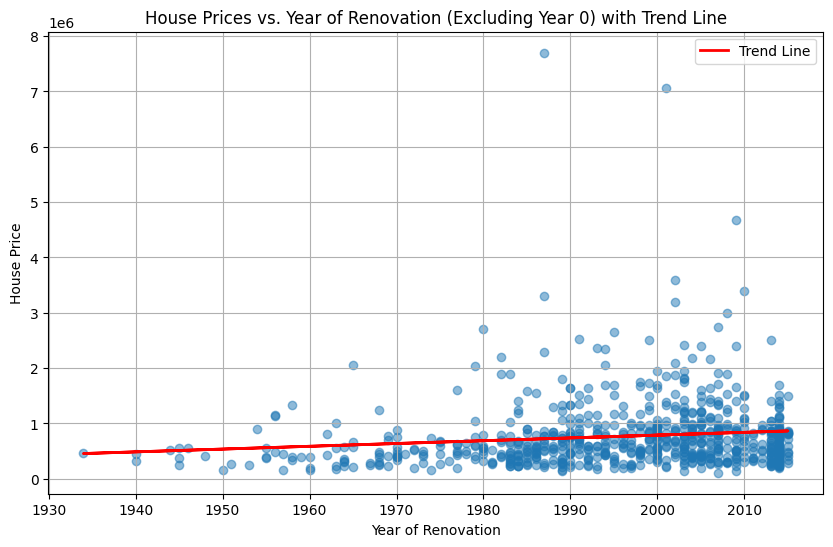

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Filter data where yr_renovated is not 0
renovated_data = king_county_house_prices_dataset_filled_missing_values[king_county_house_prices_dataset_filled_missing_values['yr_renovated'] != 0]

# Extracting data for visualization
prices = renovated_data['price'].values.reshape(-1, 1)
yr_renovated = renovated_data['yr_renovated'].values.reshape(-1, 1)

# Fit linear regression model
model = LinearRegression()
model.fit(yr_renovated, prices)
predictions = model.predict(yr_renovated)

# Creating a scatter plot with trend line
plt.figure(figsize=(10, 6))
plt.scatter(yr_renovated, prices, alpha=0.5)
plt.plot(yr_renovated, predictions, color='red', linewidth=2, label='Trend Line')
plt.title('House Prices vs. Year of Renovation (Excluding Year 0) with Trend Line')
plt.xlabel('Year of Renovation')
plt.ylabel('House Price')
plt.legend()
plt.grid(True)
plt.show()


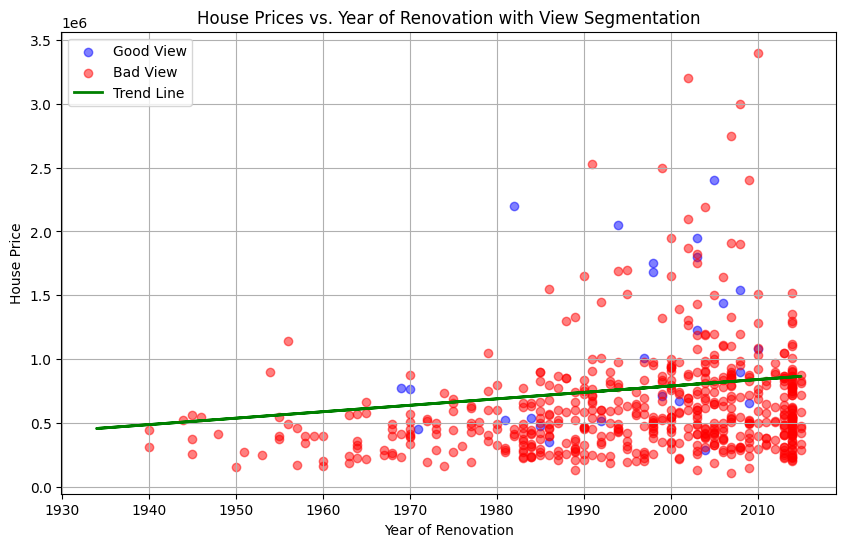

In [32]:
# lets try to segement groups based on view and with different color 
#Create scatter plot with segmented data
plt.figure(figsize=(10, 6))

# Plot data with good view (view = 1) in blue
plt.scatter(renovated_data[renovated_data['view'] == 1]['yr_renovated'], 
            renovated_data[renovated_data['view'] == 1]['price'], 
            color='blue', alpha=0.5, label='Good View')

# Plot data with bad view (view = 0) in red
plt.scatter(renovated_data[renovated_data['view'] == 0]['yr_renovated'], 
            renovated_data[renovated_data['view'] == 0]['price'], 
            color='red', alpha=0.5, label='Bad View')

# Plot trend line for all data
plt.plot(yr_renovated, predictions, color='green', linewidth=2, label='Trend Line')

plt.title('House Prices vs. Year of Renovation with View Segmentation')
plt.xlabel('Year of Renovation')
plt.ylabel('House Price')
plt.legend()
plt.grid(True)
plt.show()


In [33]:
#lets calculate distance between citycenter

In [34]:
pip install geopy


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.4/125.4 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.3/40.3 kB 4.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [35]:
from geopy.distance import geodesic

# City center coordinates (latitude and longitude)
city_center = (city_center_latitude, city_center_longitude)

# Calculate distance for each house
def calculate_distance(row):
    house_location = (row['lat'], row['long'])  # Assuming lat and long columns exist
    return geodesic(city_center, house_location).kilometers

# Add a new column for distance to city center
king_county_house_prices_dataset['distance_to_city_center'] = king_county_house_prices_dataset.apply(calculate_distance, axis=1)

# Sort houses by distance to city center
sorted_houses = king_county_house_prices_dataset.sort_values(by='distance_to_city_center')

# Display sorted houses
print(sorted_houses)


NameError: name 'city_center_latitude' is not defined

In [ ]:
# for later Get API Key: Sign up for a Google Cloud account and enable the Geocoding API.


In [38]:
import plotly.graph_objects as go

# Define the latitude and longitude boundaries for Kings County
kings_county_bounds = {
    "lon": [-122.437, -121.101],
    "lat": [47.1559, 47.777]
}

fig = go.Figure(data=go.Scattergeo(
    lon=king_county_house_prices_dataset['long'],
    lat=king_county_house_prices_dataset['lat'],
    text=king_county_house_prices_dataset['zipcode'],
    mode='markers',
    marker=dict(
        size=8,  # Set the marker size
        color=king_county_house_prices_dataset['price'],  # Color the markers based on the price
        colorscale='Viridis',  # Set the colorscale
        colorbar=dict(title='Price')  # Add a colorbar
    )
))

fig.update_geos(
    projection_type="natural earth",
    fitbounds="locations",  # Adjust the map boundaries to fit the specified locations
    visible=False,  # Hide the bounding box
    lonaxis_range=kings_county_bounds['lon'],  # Set the longitude boundaries
    lataxis_range=kings_county_bounds['lat'],   # Set the latitude boundaries
    showcountries=True,  # Show country borders
    showsubunits=True  # Show city borders
)

fig.update_layout(
    title='Location of all houses in Kings County',
    height=600,  # Adjust the height to better fit your data
    margin={"r": 0, "t": 30, "l": 0, "b": 0}
)

fig.show()


In [40]:
import plotly.graph_objects as go

# Assuming king_county_house_prices_dataset is your DataFrame with 'lat' and 'long' columns
latitudes = king_county_house_prices_dataset['lat']
longitudes = king_county_house_prices_dataset['long']

# Create a scatter mapbox plot
fig = go.Figure(go.Scattermapbox(
    lat=latitudes,
    lon=longitudes,
    mode='markers',
    marker=dict(size=10, color='blue'),
))

# Update layout with mapbox style and center
fig.update_layout(
    mapbox_style="carto-positron",  # Choose map style
    mapbox_center={"lat": latitudes.mean(), "lon": longitudes.mean()},  # Center map on average coordinates
    mapbox_zoom=4  # Set initial zoom level
)

# Show the figure
fig.show()



In [45]:
import plotly.express as px

# Assuming your dataset is 'king_county_house_prices_dataset_filled_missing_values' with 'lat' and 'long' columns
fig = px.scatter_mapbox(king_county_house_prices_dataset_filled_missing_values, 
                        lat='lat', 
                        lon='long', 
                        color='price',  # Color points based on price
                        height=800, 
                        width=1200, 
                        zoom=9)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()



In [46]:
import plotly.express as px

# Assuming king_county_house_prices_dataset_filled_missing_values is your DataFrame
fig = px.scatter_mapbox(king_county_house_prices_dataset_filled_missing_values, 
                        lat='lat', 
                        lon='long', 
                        color='zipcode',  # Segment by zip code
                        height=800, 
                        width=1200, 
                        zoom=9)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


In [47]:
# Filter the dataset to include only observations with zip codes corresponding to city centers
central_zip_codes = [
    98101, 98102, 98103, 98104, 98105, 98106, 98107, 98108, 98109, 98111, 
    98112, 98113, 98114, 98115, 98116, 98117, 98118, 98119, 98121, 98122, 
    98124, 98125, 98126, 98127, 98129, 98131, 98133, 98134, 98136, 98138, 
    98139, 98141, 98144, 98145, 98146, 98148, 98154, 98155, 98158, 98160, 
    98161, 98164, 98165, 98166, 98168, 98170, 98174, 98175, 98177, 98178, 
    98181, 98185, 98188, 98190, 98191, 98194, 98195, 98198, 98199
]
king_county_house_prices_dataset_filled_missing_values['central'] = king_county_house_prices_dataset_filled_missing_values['zipcode'].isin(central_zip_codes)

# Plot the observations on the map, segmented by whether they are in the city center or not
fig = px.scatter_mapbox(king_county_house_prices_dataset_filled_missing_values, 
                        lat='lat', 
                        lon='long', 
                        color='central',  # Segment by whether they are in the city center or not
                        height=800, 
                        width=1200, 
                        zoom=9,
                        color_discrete_map={True: 'blue', False: 'red'})  # Choose colors for segmentation
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


In [ ]:
#create a new data set only based on the city center zipcodes

In [48]:
# Filter the dataset to include only observations with zip codes corresponding to city centers
central_zip_codes = [
    98101, 98102, 98103, 98104, 98105, 98106, 98107, 98108, 98109, 98111, 
    98112, 98113, 98114, 98115, 98116, 98117, 98118, 98119, 98121, 98122, 
    98124, 98125, 98126, 98127, 98129, 98131, 98133, 98134, 98136, 98138, 
    98139, 98141, 98144, 98145, 98146, 98148, 98154, 98155, 98158, 98160, 
    98161, 98164, 98165, 98166, 98168, 98170, 98174, 98175, 98177, 98178, 
    98181, 98185, 98188, 98190, 98191, 98194, 98195, 98198, 98199
]
central_data = king_county_house_prices_dataset_filled_missing_values[king_county_house_prices_dataset_filled_missing_values['zipcode'].isin(central_zip_codes)]

# Display the subset of data
print(central_data)


               id       date     price  bedrooms  bathrooms  sqft_living  \
0      7129300520 2014-10-13  221900.0         3       1.00         1180   
1      6414100192 2014-12-09  538000.0         3       2.25         2570   
3      2487200875 2014-12-09  604000.0         4       3.00         1960   
7      2008000270 2015-01-15  291850.0         3       1.50         1060   
8      2414600126 2015-04-15  229500.0         3       1.00         1780   
...           ...        ...       ...       ...        ...          ...   
21591  2997800021 2015-02-19  475000.0         3       2.50         1310   
21592   263000018 2014-05-21  360000.0         3       2.50         1530   
21593  6600060120 2015-02-23  400000.0         4       2.50         2310   
21594  1523300141 2014-06-23  402101.0         2       0.75         1020   
21596  1523300157 2014-10-15  325000.0         2       0.75         1020   

       sqft_lot  floors  waterfront  view  ...  sqft_above  sqft_basement  \
0         

In [49]:
#lets make a new column for the previous dataset with flags form city center locations (o or 1)

# Define the central zip codes
central_zip_codes = [
    98101, 98102, 98103, 98104, 98105, 98106, 98107, 98108, 98109, 98111, 
    98112, 98113, 98114, 98115, 98116, 98117, 98118, 98119, 98121, 98122, 
    98124, 98125, 98126, 98127, 98129, 98131, 98133, 98134, 98136, 98138, 
    98139, 98141, 98144, 98145, 98146, 98148, 98154, 98155, 98158, 98160, 
    98161, 98164, 98165, 98166, 98168, 98170, 98174, 98175, 98177, 98178, 
    98181, 98185, 98188, 98190, 98191, 98194, 98195, 98198, 98199
]

# Create a new column 'in_city_center'
king_county_house_prices_dataset_filled_missing_values['in_city_center'] = king_county_house_prices_dataset_filled_missing_values['zipcode'].isin(central_zip_codes).astype(int)


In [50]:
print(king_county_house_prices_dataset_filled_missing_values.head())


           id       date     price  bedrooms  bathrooms  sqft_living  \
0  7129300520 2014-10-13  221900.0         3       1.00         1180   
1  6414100192 2014-12-09  538000.0         3       2.25         2570   
2  5631500400 2015-02-25  180000.0         2       1.00          770   
3  2487200875 2014-12-09  604000.0         4       3.00         1960   
4  1954400510 2015-02-18  510000.0         3       2.00         1680   

   sqft_lot  floors  waterfront  view  ...  sqft_basement  yr_built  \
0      5650     1.0           0   0.0  ...              0      1955   
1      7242     2.0           0   0.0  ...            400      1951   
2     10000     1.0           0   0.0  ...              0      1933   
3      5000     1.0           0   0.0  ...            910      1965   
4      8080     1.0           0   0.0  ...              0      1987   

   yr_renovated  zipcode      lat     long  sqft_living15  sqft_lot15  \
0           0.0    98178  47.5112 -122.257           1340        56

In [51]:
#now make a regression for price as dependent and city center location as independent 


import statsmodels.api as sm

# Define the dependent and independent variables
X = king_county_house_prices_dataset_filled_missing_values['in_city_center']
y = king_county_house_prices_dataset_filled_missing_values['price']

# Add a constant to the independent variable
X = sm.add_constant(X)

# Fit the linear regression model
model = sm.OLS(y, X).fit()

# Print the summary of the regression model
print(model.summary())


ModuleNotFoundError: No module named 'statsmodels'

In [52]:
pip install statsmodels


  Using cached statsmodels-0.14.2-cp311-cp311-macosx_11_0_arm64.whl.metadata (9.2 kB)
  Using cached patsy-0.5.6-py2.py3-none-any.whl.metadata (3.5 kB)
Using cached statsmodels-0.14.2-cp311-cp311-macosx_11_0_arm64.whl (10.1 MB)
Using cached patsy-0.5.6-py2.py3-none-any.whl (233 kB)
Note: you may need to restart the kernel to use updated packages.


In [53]:
#now make a regression for price as dependent and city center location as independent 


import statsmodels.api as sm

# Define the dependent and independent variables
X = king_county_house_prices_dataset_filled_missing_values['in_city_center']
y = king_county_house_prices_dataset_filled_missing_values['price']

# Add a constant to the independent variable
X = sm.add_constant(X)

# Fit the linear regression model
model = sm.OLS(y, X).fit()

# Print the summary of the regression model
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     3.089
Date:                Tue, 14 May 2024   Prob (F-statistic):             0.0788
Time:                        14:49:47   Log-Likelihood:            -3.0739e+05
No. Observations:               21597   AIC:                         6.148e+05
Df Residuals:                   21595   BIC:                         6.148e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            5.44e+05   3269.505    166.

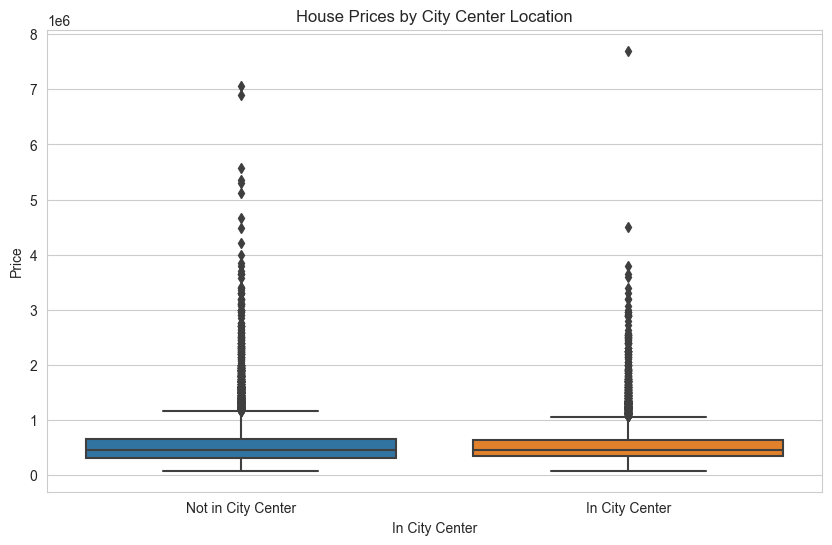

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style of the seaborn plots
sns.set_style("whitegrid")

# Create a categorical plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='in_city_center', y='price', data=king_county_house_prices_dataset_filled_missing_values)
plt.title('House Prices by City Center Location')
plt.xlabel('In City Center')
plt.ylabel('Price')
plt.xticks([0, 1], ['Not in City Center', 'In City Center'])  # Set x-axis labels
plt.show()


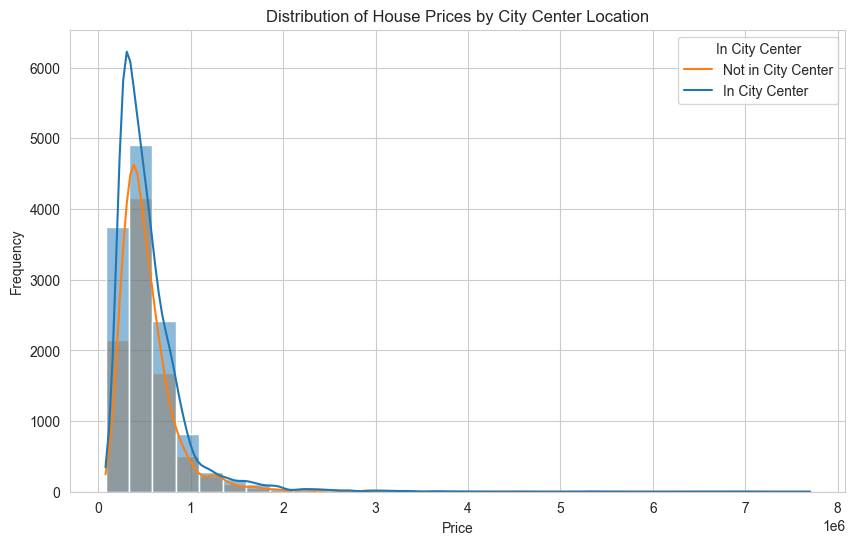

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style of the seaborn plots
sns.set_style("whitegrid")

# Create a histogram
plt.figure(figsize=(10, 6))
sns.histplot(data=king_county_house_prices_dataset_filled_missing_values, x='price', hue='in_city_center', bins=30, kde=True)
plt.title('Distribution of House Prices by City Center Location')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.legend(title='In City Center', labels=['Not in City Center', 'In City Center'])
plt.show()


In [ ]:
#create a line graph displaying house prices over time, 
#segmented by factors such as whether the property is located in the city center, 
#if it has a view, and if it features waterfront amenities?

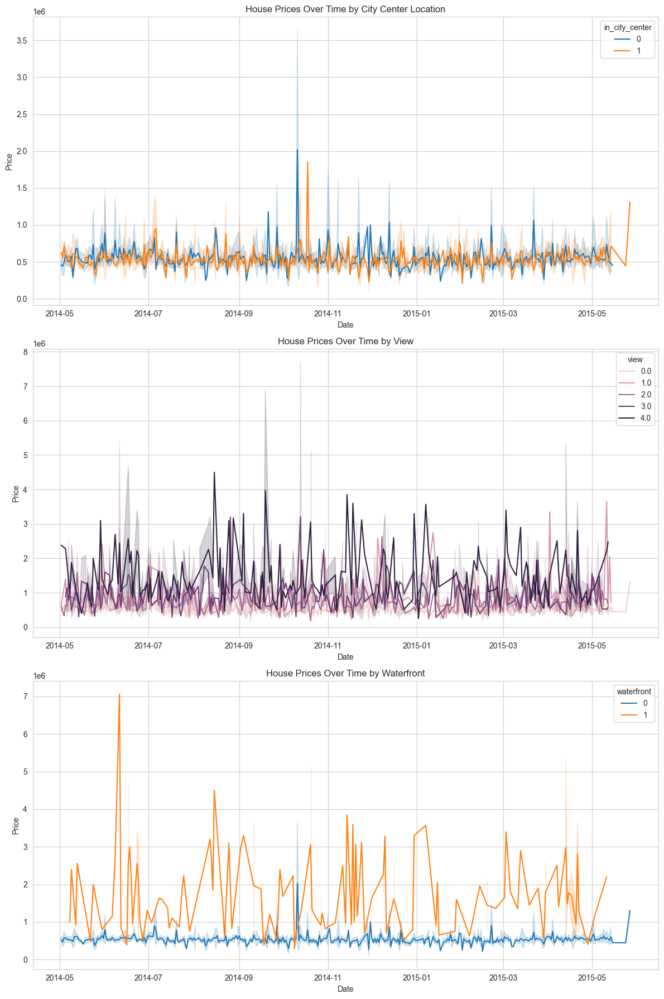

In [58]:
import matplotlib.pyplot as plt

# Create subplots
fig, axes = plt.subplots(3, 1, figsize=(12, 18))

# Plot for city center
sns.lineplot(ax=axes[0], x='date', y='price', hue='in_city_center', data=king_county_house_prices_dataset_filled_missing_values)
axes[0].set_title('House Prices Over Time by City Center Location')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Price')

# Plot for view
sns.lineplot(ax=axes[1], x='date', y='price', hue='view', data=king_county_house_prices_dataset_filled_missing_values)
axes[1].set_title('House Prices Over Time by View')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Price')

# Plot for waterfront
sns.lineplot(ax=axes[2], x='date', y='price', hue='waterfront', data=king_county_house_prices_dataset_filled_missing_values)
axes[2].set_title('House Prices Over Time by Waterfront')
axes[2].set_xlabel('Date')
axes[2].set_ylabel('Price')

plt.tight_layout()
plt.show()


In [56]:
#hypothesis: shall he renovate or not? 

In [ ]:
#the hypothessis is: the fresher renovation is - the higher the price 

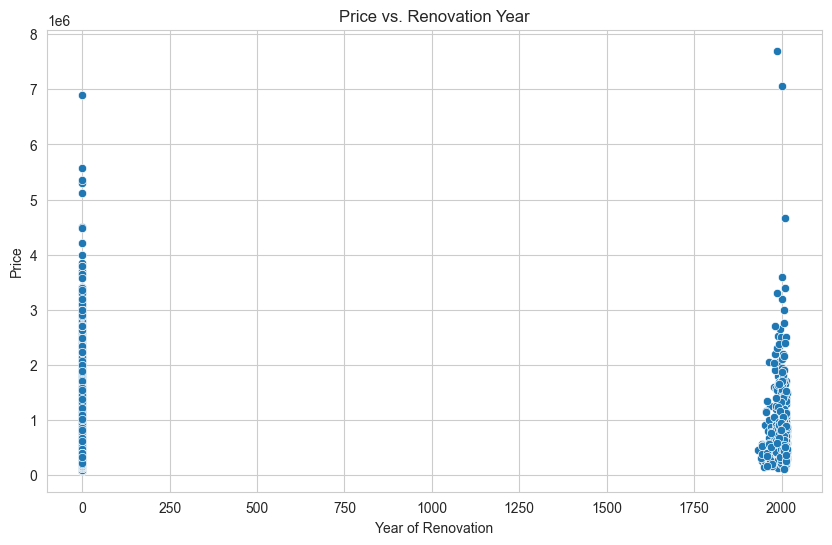

Correlation Coefficient: 0.11785522779076006


In [59]:
import matplotlib.pyplot as plt
import seaborn as sns

# Scatter plot of price vs. renovation year
plt.figure(figsize=(10, 6))
sns.scatterplot(data=king_county_house_prices_dataset_filled_missing_values, x='yr_renovated', y='price')
plt.title('Price vs. Renovation Year')
plt.xlabel('Year of Renovation')
plt.ylabel('Price')
plt.grid(True)
plt.show()

# Calculate correlation coefficient
correlation_coefficient = king_county_house_prices_dataset_filled_missing_values['yr_renovated'].corr(king_county_house_prices_dataset_filled_missing_values['price'])
print("Correlation Coefficient:", correlation_coefficient)


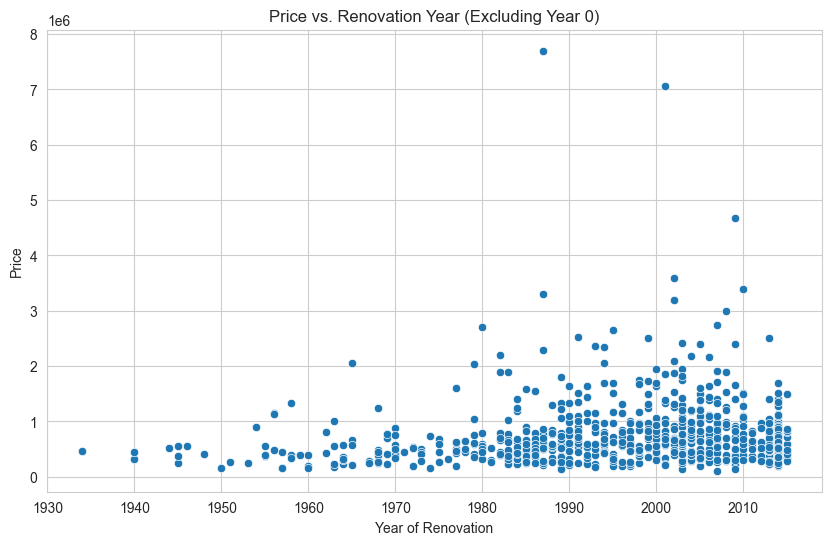

Correlation Coefficient (Excluding Year 0): 0.12549911691343754


In [60]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter dataset to exclude rows where renovation year is 0
filtered_data = king_county_house_prices_dataset_filled_missing_values[king_county_house_prices_dataset_filled_missing_values['yr_renovated'] != 0]

# Scatter plot of price vs. renovation year (filtered)
plt.figure(figsize=(10, 6))
sns.scatterplot(data=filtered_data, x='yr_renovated', y='price')
plt.title('Price vs. Renovation Year (Excluding Year 0)')
plt.xlabel('Year of Renovation')
plt.ylabel('Price')
plt.grid(True)
plt.show()

# Calculate correlation coefficient for filtered data
correlation_coefficient = filtered_data['yr_renovated'].corr(filtered_data['price'])
print("Correlation Coefficient (Excluding Year 0):", correlation_coefficient)


In [64]:
import pandas as pd

# Assuming king_county_house_prices_dataset_filled_missing_values is your DataFrame with renovation data

# Step 1: Filter out observations where yr_renovated > 1
filtered_df = king_county_house_prices_dataset_filled_missing_values[king_county_house_prices_dataset_filled_missing_values['yr_renovated'] > 1].copy()

# Convert 'yr_renovated' column to integer type
filtered_df['yr_renovated'] = filtered_df['yr_renovated'].astype(int)

# Step 2: Create a new column representing the cluster group
# Calculate the cluster group based on 10-year intervals starting from year 1
filtered_df['renovation_cluster'] = pd.cut(filtered_df['yr_renovated'], bins=range(1, filtered_df['yr_renovated'].max() + 11, 10), right=False)

# Print the first few rows to verify the changes
print(filtered_df.head())





             id       date      price  bedrooms  bathrooms  sqft_living  \
1    6414100192 2014-12-09   538000.0         3       2.25         2570   
35   9547205180 2014-06-13   696000.0         3       2.50         2300   
95   1483300570 2014-09-08   905000.0         4       2.50         3300   
103  2450000295 2014-10-07  1090000.0         3       2.50         2920   
125  4389200955 2015-03-02  1450000.0         4       2.75         2750   

     sqft_lot  floors  waterfront  view  ...  yr_built  yr_renovated  zipcode  \
1        7242     2.0           0   0.0  ...      1951          1991    98125   
35       3060     1.5           0   0.0  ...      1930          2002    98115   
95      10250     1.0           0   0.0  ...      1946          1991    98040   
103      8113     2.0           0   0.0  ...      1950          2010    98004   
125     17789     1.5           0   0.0  ...      1914          1992    98004   

         lat     long  sqft_living15  sqft_lot15  central  in_

In [65]:
# Calculate the average price for houses based on yr_renovated clusters
avg_price_by_renovation_cluster = filtered_df.groupby('renovation_cluster')['price'].mean()

# Print the average price for each renovation cluster
print(avg_price_by_renovation_cluster)


renovation_cluster
[1, 11)                   NaN
[11, 21)                  NaN
[21, 31)                  NaN
[31, 41)                  NaN
[41, 51)                  NaN
                    ...      
[1971, 1981)    623263.536585
[1981, 1991)    724712.630435
[1991, 2001)    812847.826667
[2001, 2011)    942595.195349
[2011, 2021)    660548.437037
Name: price, Length: 202, dtype: float64


In [73]:
import pandas as pd

# Assuming king_county_house_prices_dataset_filled_missing_values is your DataFrame
filtered_df = king_county_house_prices_dataset_filled_missing_values[king_county_house_prices_dataset_filled_missing_values['yr_renovated'] > 1].copy()
filtered_df['yr_renovated'] = filtered_df['yr_renovated'].astype(int)

# Create renovation clusters based on 10-year intervals starting from year 1
filtered_df['renovation_cluster'] = pd.cut(filtered_df['yr_renovated'], bins=range(1, filtered_df['yr_renovated'].max() + 11, 10), right=False)

# Print the first few rows to verify the changes
print(filtered_df.head())



             id       date      price  bedrooms  bathrooms  sqft_living  \
1    6414100192 2014-12-09   538000.0         3       2.25         2570   
35   9547205180 2014-06-13   696000.0         3       2.50         2300   
95   1483300570 2014-09-08   905000.0         4       2.50         3300   
103  2450000295 2014-10-07  1090000.0         3       2.50         2920   
125  4389200955 2015-03-02  1450000.0         4       2.75         2750   

     sqft_lot  floors  waterfront  view  ...  yr_built  yr_renovated  zipcode  \
1        7242     2.0           0   0.0  ...      1951          1991    98125   
35       3060     1.5           0   0.0  ...      1930          2002    98115   
95      10250     1.0           0   0.0  ...      1946          1991    98040   
103      8113     2.0           0   0.0  ...      1950          2010    98004   
125     17789     1.5           0   0.0  ...      1914          1992    98004   

         lat     long  sqft_living15  sqft_lot15  central  in_

In [74]:
!pwd

/Users/liliyachvileva/Desktop/neuefische/ds-eda-project-lily
